In [1]:
import pandas as pd # 
import numpy as np #
import seaborn as sns
import random
import matplotlib.pyplot as plt # veri görselleştirme kütüphanesi
from wordcloud import WordCloud, STOPWORDS #used to generate world cloud
from datetime import datetime
from timeit import default_timer

In [2]:
# movies.csv dosyasını okuma
movie_data= pd.read_csv('/Users/hamitseyrek/My_spyder_application/RecSys-Materials/ml-latest-small/movies.csv')
movie_data.shape

(9125, 3)

In [3]:
movie_data.head() #displays first 5 entries 

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [4]:
movie_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9125 entries, 0 to 9124
Data columns (total 3 columns):
movieId    9125 non-null int64
title      9125 non-null object
genres     9125 non-null object
dtypes: int64(1), object(2)
memory usage: 214.0+ KB


In [5]:
#number of unique movies
movies = movie_data['movieId'].unique().tolist()
len(movies)

9125

In [6]:
# lets explore ratings.CSV
ratings_data=pd.read_csv('/Users/hamitseyrek/My_spyder_application/RecSys-Materials/ml-latest-small/ratings.csv',sep=',')
ratings_data.shape

(100020, 4)

In [7]:
#summary of ratings.csv
ratings_data.describe()

,userId,movieId,rating,timestamp
count,100020.000000,100020.000000,100020.000000,1.000200e+05
mean,347.063457,12558.355949,3.543691,1.129647e+09
std,195.191771,26383.458657,1.058044,1.916871e+08
min,1.000000,1.000000,0.500000,7.896520e+08
25%,182.000000,1028.750000,3.000000,9.658488e+08
50%,367.000000,2407.000000,4.000000,1.110422e+09
75%,520.000000,5418.000000,4.000000,1.296192e+09
max,673.000000,163949.000000,5.000000,1.665149e+09


In [8]:
#minimum rating given to a movie
ratings_data['rating'].min() 

0.5

In [9]:
#maximum rating given to a movie
ratings_data['rating'].max()

5.0

In [10]:
# checking movies.csv
movie_data.shape

(9125, 3)

In [11]:
#is any row null
movie_data.isnull().any()

movieId    False
title      False
genres     False
dtype: bool

In [12]:
#checking ratings.csv
ratings_data.shape

(100020, 4)

In [13]:
#is any row null there
ratings_data.isnull().any()

userId       False
movieId      False
rating       False
timestamp    False
dtype: bool

In [14]:
#checking tags.csv
tags_data=pd.read_csv('/Users/hamitseyrek/My_spyder_application/RecSys-Materials/ml-latest-small/tags.csv',sep=',')
tags_data.shape

(1296, 4)

In [15]:
#is any row null in tags.csv
tags_data.isnull().any()

userId       False
movieId      False
tag          False
timestamp    False
dtype: bool

In [16]:
# lets drop null rows
tags_data=tags_data.dropna()

In [17]:
# after cleaning the data there are no more null rows in tags.csv
tags_data.isnull().any()

userId       False
movieId      False
tag          False
timestamp    False
dtype: bool

In [18]:
# number of unique tags 
unique_tags=tags_data['tag'].unique().tolist()
len(unique_tags)

582

### 4.Data Analysis

In [19]:
data=movie_data

In [20]:
# filtering to get the list of drama movies
drama_movies=movie_data['genres'].str.contains('Drama')
movie_data[drama_movies].head()

,movieId,title,genres
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
10,11,"American President, The (1995)",Comedy|Drama|Romance
13,14,Nixon (1995),Drama
15,16,Casino (1995),Crime|Drama
16,17,Sense and Sensibility (1995),Drama|Romance


In [21]:
#total number of drama movies
drama_movies.shape

(9125,)

In [22]:
#filtering to get the list of comedy movies
comedy_movies = data['genres'].str.contains('Comedy')
movie_data[comedy_movies].head()

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy
6,7,Sabrina (1995),Comedy|Romance


In [23]:
#total no. of comedy movies
comedy_movies.shape

(9125,)

In [24]:
#search movie id by tag search
tag_search = tags_data['tag'].str.contains('dark')
tags_data[tag_search].head()

,userId,movieId,tag,timestamp
111,212,1732,dark comedy,1253929372
156,212,48394,dark,1218405627
179,212,66097,dark,1253926337
341,364,47,dark,1444534994
500,364,109249,dark humor,1444529660


In [25]:
#displays first 5 data from a dataframe
#here rating.csv has 4 columns
ratings_data.head() 

,userId,movieId,rating,timestamp
0,1,31,2.5,1260759144
1,1,1029,3.0,1260759179
2,1,1061,3.0,1260759182
3,1,1129,2.0,1260759185
4,1,1172,4.0,1260759205


In [26]:
del ratings_data['timestamp']

In [27]:
#displays first 5 data from a dataframe
#here ratings.csv has 3 columns
ratings_data.head() 

,userId,movieId,rating
0,1,31,2.5
1,1,1029,3.0
2,1,1061,3.0
3,1,1129,2.0
4,1,1172,4.0


In [28]:
#displays first 5 data from a dataframe
#here movies.csv has 3 columns
movie_data.head()

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [29]:
#merging two dataframes "movies.csv" and "ratings.csv"
movie_data_ratings_data=movie_data.merge(ratings_data,on = 'movieId',how = 'inner')
movie_data_ratings_data.head(3)

,movieId,title,genres,userId,rating
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,7,3.0
1,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,9,4.0
2,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,13,5.0


In [30]:
#displays high rated movies
high_rated= movie_data_ratings_data['rating']>4.0
movie_data_ratings_data[high_rated].head(10)

,movieId,title,genres,userId,rating
2,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,13,5.0
7,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,26,5.0
12,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,47,5.0
16,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,63,5.0
19,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,69,5.0
20,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,70,5.0
22,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,73,5.0
29,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,89,5.0
31,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,91,5.0
32,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,92,5.0


In [31]:
# displays low rated movies
low_rated = movie_data_ratings_data['rating']<4.0
movie_data_ratings_data[low_rated].head()

,movieId,title,genres,userId,rating
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,7,3.0
3,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,15,2.0
4,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,19,3.0
5,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,20,3.5
6,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,23,3.0


In [32]:
#total number of unique movie genre
unique_genre=movie_data['genres'].unique().tolist()
len(unique_genre)

902

In [33]:
#top 25 most rated movies
most_rated = movie_data_ratings_data.groupby('title').size().sort_values(ascending=False)[:25]
most_rated.head(25)

title
Forrest Gump (1994)                                                               341
Pulp Fiction (1994)                                                               324
Shawshank Redemption, The (1994)                                                  311
Silence of the Lambs, The (1991)                                                  304
Star Wars: Episode IV - A New Hope (1977)                                         291
Jurassic Park (1993)                                                              274
Matrix, The (1999)                                                                259
Toy Story (1995)                                                                  247
Schindler's List (1993)                                                           244
Terminator 2: Judgment Day (1991)                                                 237
Star Wars: Episode V - The Empire Strikes Back (1980)                             234
Braveheart (1995)                               

In [34]:
#slicing out columns to display only title and genres columns from movies.csv
movie_data[['title','genres']].head()

,title,genres
0,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,Jumanji (1995),Adventure|Children|Fantasy
2,Grumpier Old Men (1995),Comedy|Romance
3,Waiting to Exhale (1995),Comedy|Drama|Romance
4,Father of the Bride Part II (1995),Comedy


In [35]:
# here we extract year from title
data['year'] =movie_data['title'].str.extract('.*\((.*)\).*',expand = False)
data.head(5)

,movieId,title,genres,year
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1995
1,2,Jumanji (1995),Adventure|Children|Fantasy,1995
2,3,Grumpier Old Men (1995),Comedy|Romance,1995
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,1995
4,5,Father of the Bride Part II (1995),Comedy,1995


### Movie per year

In [36]:
avg_rates_year=data[['year','rating']].groupby(['year']).mean()

KeyError: "['rating'] not in index"

###### https://faye1010.wordpress.com/2017/02/07/exploratory-analysis-of-movielen-dataset-using-python/

In [37]:
data

,movieId,title,genres,year
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1995
1,2,Jumanji (1995),Adventure|Children|Fantasy,1995
2,3,Grumpier Old Men (1995),Comedy|Romance,1995
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,1995
4,5,Father of the Bride Part II (1995),Comedy,1995
...,...,...,...,...
9120,162672,Mohenjo Daro (2016),Adventure|Drama|Romance,2016
9121,163056,Shin Godzilla (2016),Action|Adventure|Fantasy|Sci-Fi,2016
9122,163949,The Beatles: Eight Days a Week - The Touring Y...,Documentary,2016
9123,164977,The Gay Desperado (1936),Comedy,1936


In [38]:
movie_data

,movieId,title,genres,year
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1995
1,2,Jumanji (1995),Adventure|Children|Fantasy,1995
2,3,Grumpier Old Men (1995),Comedy|Romance,1995
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,1995
4,5,Father of the Bride Part II (1995),Comedy,1995
...,...,...,...,...
9120,162672,Mohenjo Daro (2016),Adventure|Drama|Romance,2016
9121,163056,Shin Godzilla (2016),Action|Adventure|Fantasy|Sci-Fi,2016
9122,163949,The Beatles: Eight Days a Week - The Touring Y...,Documentary,2016
9123,164977,The Gay Desperado (1936),Comedy,1936


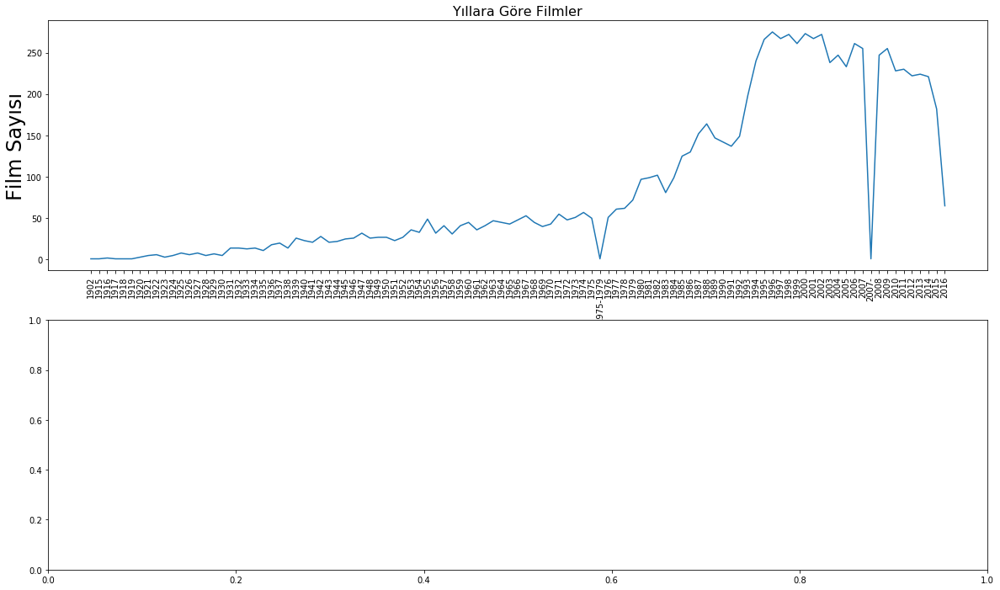

In [39]:
sub=data[data['year']!=0]
fig1, (ax3,ax4) = plt.subplots(2,1,figsize=(20,12))
plt.subplot(211)
plt.plot(sub.groupby(['year']).count()['title'])
plt.title('Yıllara Göre Filmler',fontsize=16)
plt.xticks(rotation='vertical')
plt.ylabel("Film Sayısı", fontsize = 24, labelpad = 0)
plt.subplot(212)
#a2=plt.plot(avg_rates_year)
#plt.title('Averageings vs genres',fontsize=16)
#plt.grid(True)
#plt.tight_layout()
#fig.savefig('Number of Movies and average ratings VS years.jpg')



In [40]:
data[True]

KeyError: True

## Tag Word Cloud

In [203]:
tag_data= pd.read_csv('/Users/hamitseyrek/My_spyder_application/RecSys-Materials/ml-latest-small/tags.csv')
tag_data.shape

(1296, 4)

In [204]:
#define a function that counts the number of times each genre appear:
def count_word(df, ref_col, liste):
    keyword_count = dict()
    for s in liste: keyword_count[s] = 0
    for liste_keywords in df[ref_col].str.split(' '):
        if type(liste_keywords) == float and pd.isnull(liste_keywords): continue
        for s in liste_keywords: 
            if pd.notnull(s): keyword_count[s] += 1
    # convert the dictionary in a list to sort the keywords  by frequency
    keyword_occurences = []
    for k,v in keyword_count.items():
        keyword_occurences.append([k,v])
    keyword_occurences.sort(key = lambda x:x[1], reverse = True)
    return keyword_occurences, keyword_count

#here we  make census of the genres:
genre_labels = set()
for s in tag_data['tag'].str.split(' ').values:
    genre_labels = genre_labels.union(set(s))

In [208]:
#counting how many times each of genres occur:
keyword_occurences, dum = count_word(tag_data, 'tag', genre_labels)
len(keyword_occurences)

856

In [213]:
#define a function that counts the number of times each genre appear:
def count_word(df, ref_col, liste):
    keyword_count = dict()
    for s in liste: keyword_count[s] = 0
    for liste_keywords in df[ref_col].str.split(' '):
        if type(liste_keywords) == float and pd.isnull(liste_keywords): continue
        for s in liste_keywords: 
            if pd.notnull(s): keyword_count[s] += 1
    # convert the dictionary in a list to sort the keywords  by frequency
    keyword_occurences = []
    for k,v in keyword_count.items():
        keyword_occurences.append([k,v])
    keyword_occurences.sort(key = lambda x:x[1], reverse = True)
    return keyword_occurences, keyword_count

print(len(tag_data['movieId'].values))

1296


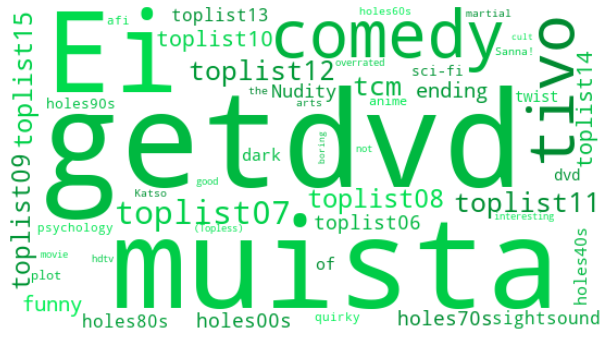

In [44]:
# Function that control the color of the words
def random_color_func(word=None, font_size=None, position=None,
                      orientation=None, font_path=None, random_state=None):
    h = int(360.0 * tone / 255.0)
    s = int(100.0 * 255.0 / 255.0)
    l = int(100.0 * float(random_state.randint(70, 120)) / 255.0)
    return "hsl({}, {}%, {}%)".format(h, s, l)


#Finally, the result is shown as a wordcloud:
words = dict()
trunc_occurences = keyword_occurences[0:50]
for s in trunc_occurences:
    words[s[0]] = s[1]
tone = 100 # define the color of the words
f, ax = plt.subplots(figsize=(14, 6))
wordcloud = WordCloud(width=550,height=300, background_color='white', 
                      max_words=1628,relative_scaling=0.7,
                      color_func = random_color_func,
                      normalize_plurals=False)
wordcloud.generate_from_frequencies(words)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [45]:
from collections import defaultdict

import csv
tags_path = '/Users/hamitseyrek/My_spyder_application/RecSys-Materials/ml-latest-small/tags.csv'
tags = defaultdict(list)
tagIDs = {}
maxTagID = 0
with open(tags_path, newline='', encoding='ISO-8859-1') as csvfile:
    movieReader = csv.reader(csvfile)
    next(movieReader)  #Skip header line
    for row in movieReader:
        movieID = int(row[1])
        tagList = row[2].split(' ')
        tagIDList = []
        for tag in tagList:
            if tag in tagIDs:
                tagID = tagIDs[tag]
            else:
                tagID = maxTagID
                tagIDs[tag] = tagID
                maxTagID += 1
            tagIDList.append(tagID)
            tags[movieID] = tagIDList
# Convert integer-encoded genre lists to bitfields that we can treat as vectors
for (movieID, tagIDList) in tags.items():
    bitfield = [0] * maxTagID
    for tagID in tagIDList:
        bitfield[tagID] = 1
    tags[movieID] = bitfield 

In [47]:
tags

defaultdict(list,
            {339: [1,
              1,
              1,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
        

### movie per genre 

In [96]:
#define a function that counts the number of times each genre appear:
def count_word(df, ref_col, liste):
    keyword_count = dict()
    for s in liste: keyword_count[s] = 0
    for liste_keywords in df[ref_col].str.split('|'):
        if type(liste_keywords) == float and pd.isnull(liste_keywords): continue
        for s in liste_keywords: 
            if pd.notnull(s): keyword_count[s] += 1
    # convert the dictionary in a list to sort the keywords  by frequency
    keyword_occurences = []
    for k,v in keyword_count.items():
        keyword_occurences.append([k,v])
    keyword_occurences.sort(key = lambda x:x[1], reverse = True)
    return keyword_occurences, keyword_count

#here we  make census of the genres:
genre_labels = set()
for s in data['genres'].str.split('|').values:
    genre_labels = genre_labels.union(set(s))

In [97]:
#counting how many times each of genres occur:
keyword_occurences, dum = count_word(data, 'genres', genre_labels)
keyword_occurences

[['Drama', 4365],
 ['Comedy', 3315],
 ['Thriller', 1729],
 ['Action', 1545],
 ['Romance', 1545],
 ['Adventure', 1117],
 ['Crime', 1100],
 ['Horror', 877],
 ['Sci-Fi', 792],
 ['Fantasy', 654],
 ['Children', 583],
 ['Mystery', 543],
 ['Documentary', 495],
 ['Animation', 447],
 ['Musical', 394],
 ['War', 367],
 ['Western', 168],
 ['IMAX', 153],
 ['Film-Noir', 133],
 ['(no genres listed)', 18]]

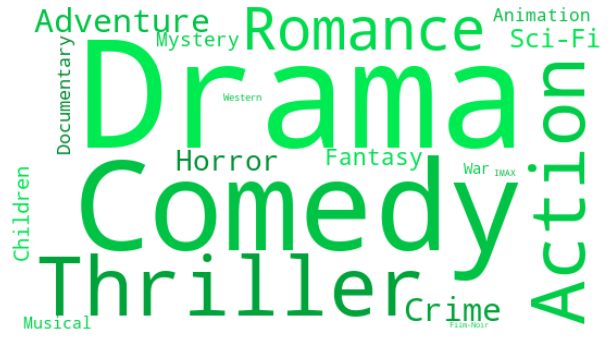

In [98]:
# Function that control the color of the words
def random_color_func(word=None, font_size=None, position=None,
                      orientation=None, font_path=None, random_state=None):
    h = int(360.0 * tone / 255.0)
    s = int(100.0 * 255.0 / 255.0)
    l = int(100.0 * float(random_state.randint(70, 120)) / 255.0)
    return "hsl({}, {}%, {}%)".format(h, s, l)


#Finally, the result is shown as a wordcloud:
words = dict()
trunc_occurences = keyword_occurences[0:50]
for s in trunc_occurences:
    words[s[0]] = s[1]
tone = 100 # define the color of the words
f, ax = plt.subplots(figsize=(14, 6))
wordcloud = WordCloud(width=550,height=300, background_color='white', 
                      max_words=1628,relative_scaling=0.7,
                      color_func = random_color_func,
                      normalize_plurals=False)
wordcloud.generate_from_frequencies(words)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

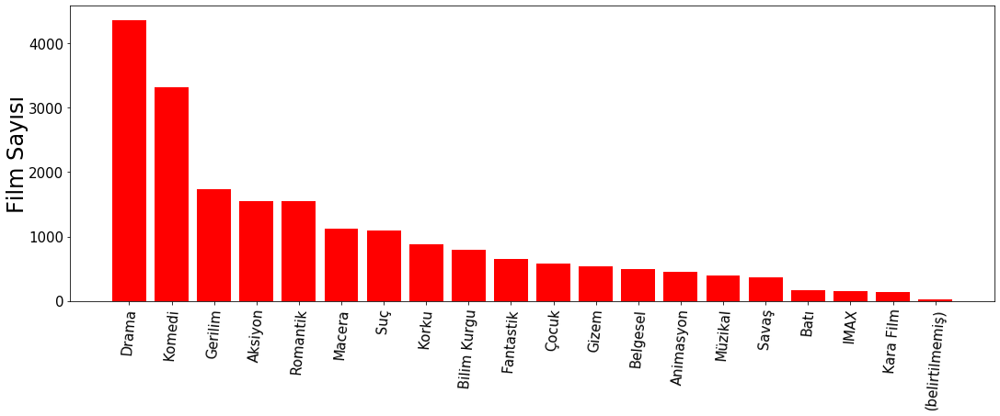

In [104]:
# Türlerin popülaritesinin histogramını çizmek
fig = plt.figure(1, figsize=(18,13))
ax2 = fig.add_subplot(2,1,2)
y_axis = [i[1] for i in trunc_occurences]
x_axis = [k for k,i in enumerate(trunc_occurences)]
trunc_occurences[1][0]="Komedi"
trunc_occurences[2][0]="Gerilim"
trunc_occurences[3][0]="Aksiyon"
trunc_occurences[4][0]="Romantik"
trunc_occurences[5][0]="Macera"
trunc_occurences[6][0]="Suç"
trunc_occurences[7][0]="Korku"
trunc_occurences[8][0]="Bilim Kurgu"
trunc_occurences[9][0]="Fantastik"
trunc_occurences[10][0]="Çocuk"
trunc_occurences[11][0]="Gizem"
trunc_occurences[12][0]="Belgesel"
trunc_occurences[13][0]="Animasyon"
trunc_occurences[14][0]="Müzikal"
trunc_occurences[15][0]="Savaş"
trunc_occurences[16][0]="Batı"
trunc_occurences[17][0]="IMAX"
trunc_occurences[18][0]="Kara Film"
trunc_occurences[19][0]="(belirtilmemiş)"

x_label = [i[0] for i in trunc_occurences]
plt.xticks(rotation=85, fontsize = 15)
plt.yticks(fontsize = 15)
plt.xticks(x_axis, x_label)
plt.ylabel("Film Sayısı", fontsize = 24, labelpad = 0)
ax2.bar(x_axis, y_axis, align = 'center', color='r')
#plt.title("Türlerin Popülerliği",bbox={'facecolor':'k', 'pad':5},color='w',fontsize = 30)
plt.show()

### Toystory

In [105]:
toystory_data = ratings_data[ratings_data['movieId']==1]
toystory_data.head(10)

,userId,movieId,rating
495,7,1,3.0
699,9,1,4.0
889,13,1,5.0
962,15,1,2.0
3105,19,1,3.0
3528,20,1,3.5
4008,23,1,3.0
4781,26,1,5.0
5048,30,1,4.0
6625,37,1,4.0


In [106]:
toystory_data.groupby('rating').size()

rating
1.0     4
1.5     3
2.0    13
2.5     4
3.0    41
3.5    23
4.0    77
4.5    19
5.0    63
dtype: int64

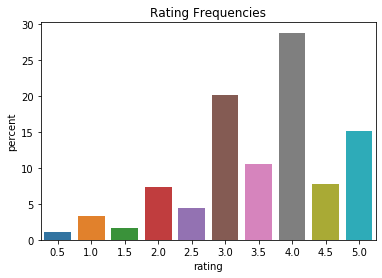

In [107]:
norm_counts = (
    ratings_data['rating']
    .value_counts(normalize=True, sort=False)
    .multiply(100)
    .reset_index()
    .rename(columns={'rating': 'percent', 'index': 'rating'})
)
ax = sns.barplot(x='rating', y='percent', data=norm_counts)
ax.set_title('Rating Frequencies')
plt.show()

In [108]:
toystory_data_group = toystory_data.groupby('rating')
toystory_data_group.agg({'rating':'mean'})

,rating
rating,
1.0,1.0
1.5,1.5
2.0,2.0
2.5,2.5
3.0,3.0
3.5,3.5
4.0,4.0
4.5,4.5
5.0,5.0


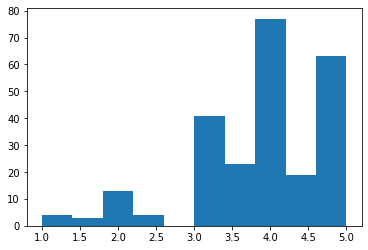

In [109]:
plt.hist(x=toystory_data['rating'])
plt.show()

### Top 25 movies by viewership rating

In [110]:
movie_rating = ratings_data.groupby(['movieId'], as_index=False)
average_movie_ratings = movie_rating.agg({'rating':'mean'})
top_25_movies = average_movie_ratings.sort_values('rating', ascending=False).head(25)
top_25_movies

,movieId,rating
9065,163949,5.0
7297,71180,5.0
6629,51471,5.0
6662,52617,5.0
6704,53887,5.0
6717,54251,5.0
6726,54328,5.0
6785,55555,5.0
6836,56869,5.0
6843,57038,5.0


In [111]:
#The below list shows top 25 movies by viewership data
pd.merge(top_25_movies, movie_data, how='left', left_on=['movieId'], right_on=['movieId'])

,movieId,rating,title,genres,year
0,163949,5.0,The Beatles: Eight Days a Week - The Touring Y...,Documentary,2016
1,71180,5.0,Padre padrone (1977),Drama,1977
2,51471,5.0,Amazing Grace (2006),Drama|Romance,2006
3,52617,5.0,Woman on the Beach (Haebyeonui yeoin) (2006),Comedy|Drama,2006
4,53887,5.0,O Lucky Man! (1973),Comedy|Drama|Fantasy|Musical,1973
5,54251,5.0,Dorian Blues (2004),Comedy,2004
6,54328,5.0,My Best Friend (Mon meilleur ami) (2006),Comedy,2006
7,55555,5.0,"Edge of Heaven, The (Auf der anderen Seite) (2...",Drama,2007
8,56869,5.0,Drained (O cheiro do Ralo) (2006),Comedy,2006
9,57038,5.0,To the Left of the Father (Lavoura Arcaica) (2...,Drama,2001


### Rating of userid = 2696

In [112]:
user_rating_data = ratings_data[ratings_data['userId']==673]
user_rating_data.head()

,userId,movieId,rating
100004,673,1221,4.5
100005,673,122892,4.5
100006,673,122920,4.5
100007,673,135887,4.0
100008,673,97225,3.0


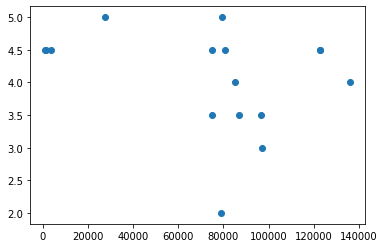

In [113]:
# plotting the above data
plt.scatter(x=user_rating_data['movieId'], y=user_rating_data['rating'])
plt.show()

/Users/hamitseyrek/anaconda3/envs/SeyRec/lib/python3.7/site-packages/pandas/plotting/_matplotlib/misc.py:71: UserWarning: Attempting to set identical left == right == 673.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])
/Users/hamitseyrek/anaconda3/envs/SeyRec/lib/python3.7/site-packages/pandas/plotting/_matplotlib/misc.py:81: UserWarning: Attempting to set identical bottom == top == 673.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
/Users/hamitseyrek/anaconda3/envs/SeyRec/lib/python3.7/site-packages/pandas/plotting/_matplotlib/misc.py:80: UserWarning: Attempting to set identical left == right == 673.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])


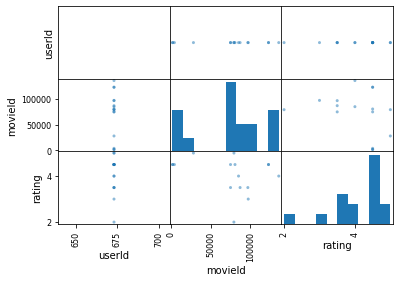

In [114]:
from pandas.plotting import scatter_matrix
scatter_matrix(user_rating_data)
plt.show()

### 3. Prepare Data

### grafikler

In [115]:
# lets explore ratings.CSV
ratings_data=pd.read_csv('/Users/hamitseyrek/My_spyder_application/RecSys-Materials/ml-latest-small/ratings.csv',sep=',')
ratings_data.shape

(100020, 4)

In [116]:

ratings_data['timestamp'] = ratings_data['timestamp'].apply(datetime.fromtimestamp)
ratings_data['year'] = ratings_data['timestamp'].dt.year
ratings_data['month'] = ratings_data['timestamp'].dt.month
ratings_data = ratings_data.sort_values('timestamp')
print('First 5:')
display(ratings_data.head())
print()
print('Last 5:')
display(ratings_data.tail())

First 5:


,userId,movieId,rating,timestamp,year,month
52635,383,21,3.0,1995-01-09 13:46:49,1995,1
52641,383,47,5.0,1995-01-09 13:46:49,1995,1
52684,383,1079,3.0,1995-01-09 13:46:49,1995,1
56917,409,85,5.0,1996-03-30 21:00:12,1996,3
56913,409,35,4.0,1996-03-30 21:00:12,1996,3



Last 5:


,userId,movieId,rating,timestamp,year,month
35140,251,81847,4.5,2016-10-16 16:08:02,2016,10
35096,251,6377,4.5,2016-10-16 16:08:20,2016,10
35069,251,1704,4.5,2016-10-16 20:57:24,2016,10
100010,673,86911,3.5,2019-08-07 06:40:01,2019,8
100011,673,84944,4.0,2022-10-07 16:26:41,2022,10


,year,month,# of Ratings
Date,,,
1995-01-01,1995,1,3
1996-03-01,1996,3,116
1996-04-01,1996,4,226
1996-05-01,1996,5,751
1996-06-01,1996,6,829
...,...,...,...
2016-08-01,2016,8,1140
2016-09-01,2016,9,146
2016-10-01,2016,10,301


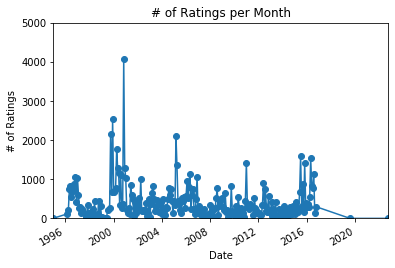

In [117]:
month_counts = ratings_data[['year', 'month', 'rating']].groupby(['year', 'month']).count()
month_counts = month_counts.rename(index=str, columns={'rating': '# of Ratings'})
month_counts = month_counts.reset_index()
month_counts['Date'] = month_counts[['year', 'month']].apply(
    lambda x: datetime(year=int(x[0]), month=int(x[1]), day=1), axis=1
)
month_counts = month_counts.set_index('Date', drop=True)
display(month_counts)
month_counts['# of Ratings'].plot(style='o-')
plt.ylabel('# of Ratings')
plt.title('# of Ratings per Month')
plt.ylim([0, 5000])
plt.gca().grid(which='minor')
plt.show()

### 1. How are the ratings distributed?
I'd like to see what ratings are common and uncommon, so let's just plot counts of each rating:

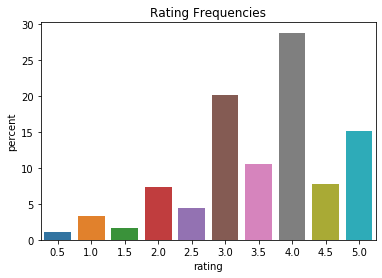

In [118]:
norm_counts = (
    ratings_data['rating']
    .value_counts(normalize=True, sort=False)
    .multiply(100)
    .reset_index()
    .rename(columns={'rating': 'percent', 'index': 'rating'})
)
ax = sns.barplot(x='rating', y='percent', data=norm_counts)
ax.set_title('Rating Frequencies')
plt.show()

### 2. How many ratings were submitted per month?

###### The number of ratings had a fairly large spike in November of 1998, but otherwise was relatively constant.

This leads to another question about changes over time:

,index,userId,movieId,# of Ratings,timestamp,year,month
Date,,,,,,,
1995-01-01,52635,383,21,3.0,1995-01-09 13:46:49,1995,1
1995-01-01,52641,383,47,5.0,1995-01-09 13:46:49,1995,1
1995-01-01,52684,383,1079,3.0,1995-01-09 13:46:49,1995,1
1996-03-01,56917,409,85,5.0,1996-03-30 21:00:12,1996,3
1996-03-01,56913,409,35,4.0,1996-03-30 21:00:12,1996,3
...,...,...,...,...,...,...,...
2016-10-01,35140,251,81847,4.5,2016-10-16 16:08:02,2016,10
2016-10-01,35096,251,6377,4.5,2016-10-16 16:08:20,2016,10
2016-10-01,35069,251,1704,4.5,2016-10-16 20:57:24,2016,10


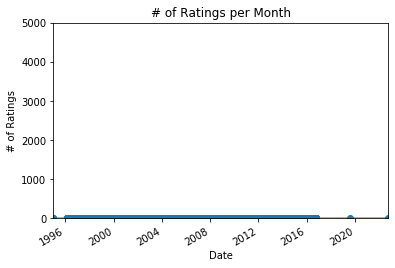

In [119]:
month_counts = ratings_data[['year', 'month', 'rating']].groupby(['year', 'month']).count()
month_counts = ratings_data.rename(index=str, columns={'rating': '# of Ratings'})
month_counts = month_counts.reset_index()
month_counts['Date'] = month_counts[['year', 'month']].apply(
    lambda x: datetime(year=int(x[0]), month=int(x[1]), day=1), axis=1
)
month_counts = month_counts.set_index('Date', drop=True)
display(month_counts)
month_counts['# of Ratings'].plot(style='o-')
plt.ylabel('# of Ratings')
plt.title('# of Ratings per Month')
plt.ylim([0, 5000])
plt.gca().grid(which='minor')
plt.show()

### 5. How consistent are the average ratings over time?

,year,month,Rating,std
Date,,,,
1995-01-01,1995,1,3.666667,1.154701
1996-03-01,1996,3,4.241379,0.693080
1996-04-01,1996,4,3.889381,1.033300
1996-05-01,1996,5,3.613848,0.883943
1996-06-01,1996,6,3.568154,0.941142
...,...,...,...,...
2016-08-01,2016,8,2.908772,1.178909
2016-09-01,2016,9,3.578767,1.059747
2016-10-01,2016,10,3.955150,1.067153


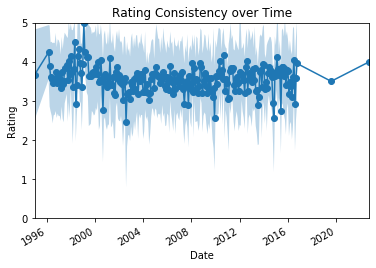

In [120]:
month_counts = ratings_data.groupby(['year', 'month'])['rating'].agg([np.mean, np.std])
month_counts = month_counts.rename(index=str, columns={'mean': 'Rating'})
month_counts = month_counts.reset_index()
month_counts['Date'] = month_counts[['year', 'month']].apply(
    lambda x: datetime(year=int(x[0]), month=int(x[1]), day=1), axis=1
)
month_counts = month_counts.set_index('Date', drop=True)
display(month_counts)
month_counts['Rating'].plot(style='o-')
plt.fill_between(month_counts.index,
                 month_counts['Rating'] - month_counts['std'],
                 month_counts['Rating'] + month_counts['std'],
                 alpha=0.3,
                )
plt.ylim([0, 5])
plt.ylabel('Rating')
plt.gca().grid(which='minor')
plt.title('Rating Consistency over Time')
plt.show()

### How quickly do the movie and user bases grow over time?

,userId,movieId,rating,timestamp,year,month,Date
52635,383,21,3.0,1995-01-09 13:46:49,1995,1,1995-01-01
52641,383,47,5.0,1995-01-09 13:46:49,1995,1,1995-01-01
52684,383,1079,3.0,1995-01-09 13:46:49,1995,1,1995-01-01
56917,409,85,5.0,1996-03-30 21:00:12,1996,3,1996-03-01
56913,409,35,4.0,1996-03-30 21:00:12,1996,3,1996-03-01


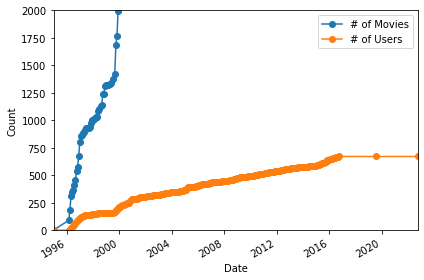

In [121]:
ratings_data['Date'] = ratings_data[['year', 'month']].apply(
    lambda x: datetime(year=int(x[0]), month=int(x[1]), day=1), axis=1
)
display(ratings_data.head())
n_users = []
n_movies = []
dates = np.unique(ratings_data['Date'])
for date in dates:
    n_users.append(ratings_data[ratings_data['Date'] <= date]['userId'].nunique())
    n_movies.append(ratings_data[ratings_data['Date'] <= date]['movieId'].nunique())
df_users = pd.DataFrame({'Date': dates, '# of Users': n_users}).set_index('Date')
df_movies = pd.DataFrame({'Date': dates, '# of Movies': n_movies}).set_index('Date')
fig, ax = plt.subplots()
df_movies['# of Movies'].plot(style='o-', ax=ax)
df_users['# of Users'].plot(style='o-', ax=ax)
plt.ylabel('Count')
plt.ylim([0, 2000])
ax.grid(which='minor')
plt.tight_layout()
plt.legend()
plt.show()

### Superhero tagını göstermek

In [122]:
movies_pd= pd.read_csv('/Users/hamitseyrek/My_spyder_application/RecSys-Materials/ml-latest-small/movies.csv')
rates_pd =pd.read_csv('/Users/hamitseyrek/My_spyder_application/RecSys-Materials/ml-latest-small/ratings.csv')
links_pd=pd.read_csv('/Users/hamitseyrek/My_spyder_application/RecSys-Materials/ml-latest-small/links.csv')
tags_pd=pd.read_csv('/Users/hamitseyrek/My_spyder_application/RecSys-Materials/ml-latest-small/tags.csv')
#genome_scores_pd=pd.read_csv(‘genome_scores.csv’)
#genome_tags_pd=pd.read_csv(‘genome_tags.csv’)

tags_pd=tags_pd.dropna()

hero_movies=tags_pd['tag'].str.match('superhero', case = False)

moviedata=tags_pd[hero_movies].merge(movies_pd,on = 'movieId',how = 'inner')
moviedata=moviedata.merge(rates_pd,on = 'movieId',how = 'inner')
moviedata['year'] =moviedata['title'].str.extract('.*\((.*)\).*',expand = False)

avg_rates_titles = moviedata[['title','year','rating']].groupby('title').mean()
dataframe = avg_rates_titles.sort_values(by=['rating'], ascending = False)
print(dataframe)

                                   rating
title                                    
Hellboy (2004)                   3.285714
Superman II (1980)               3.197368
X-Men Origins: Wolverine (2009)  2.911765


## Yıllara göre grafik çizme

In [189]:
start = default_timer()
#plt.style.use('ggplot')

st = default_timer()

# First time data load.
movies = pd.read_csv('/Users/hamitseyrek/My_spyder_application/RecSys-Materials/ml-latest-small/movies.csv')
ratings = pd.read_csv('/Users/hamitseyrek/My_spyder_application/RecSys-Materials/ml-latest-small/ratings.csv')
    
# Organise a bit and store into feather-format
movies.sort_values(by='movieId', inplace=True)
movies.reset_index(inplace=True, drop=True)
ratings.sort_values(by='movieId', inplace=True)
ratings.reset_index(inplace=True, drop=True)

print(ratings.dtypes)

# Split title and release year in separate columns in movies dataframe. Convert year to timestamp.
movies['year'] = movies.title.str.extract("\((\d{4})\)", expand=True)
movies.year = pd.to_datetime(movies.year, format='%Y')
movies.year = movies.year.dt.year # As there are some NaN years, resulting type will be float (decimals)
movies.title = movies.title.str[:-7]



# Categorize movies genres properly. Working later with +20MM rows of strings proved very resource consuming
genres_unique = pd.DataFrame(movies.genres.str.split('|').tolist()).stack().unique()


genres_unique=["Macera","Animasyon","Çocuk","Komedi","Fantastik","Romantik","Drama","Aksiyon","Suç","Gerilim","Korku","Gizem","Bilim Kurgu","Belgesel","IMAX","Savaş","Müzikal","Batı","Kara Film","(belirtilmemiş)"]




genres_unique = pd.DataFrame(genres_unique, columns=['genre']) # Format into DataFrame to store later
movies = movies.join(movies.genres.str.get_dummies().astype(bool))
movies.drop('genres', inplace=True, axis=1)
# Modify rating timestamp format (from seconds to datetime year)
#ratings.timestamp = pd.to_datetime(ratings.timestamp, unit='s')
ratings.timestamp = pd.to_datetime(ratings.timestamp, infer_datetime_format=True)
ratings.timestamp = ratings.timestamp.dt.year

# Check and clean NaN values
print ("Number of movies Null values: ", max(movies.isnull().sum()))
print ("Number of ratings Null values: ", max(ratings.isnull().sum()))
movies.dropna(inplace=True)
ratings.dropna(inplace=True)
    
# Organise a bit, then save into feather-formatand clear from memory
movies.sort_values(by='movieId', inplace=True)
ratings.sort_values(by='movieId', inplace=True)
movies.reset_index(inplace=True, drop=True)
ratings.reset_index(inplace=True, drop=True)
    
runtime = default_timer() - st
print ("Elapsed time(sec): ", round(runtime,2))

userId         int64
movieId        int64
rating       float64
timestamp      int64
dtype: object
              genre
0            Macera
1         Animasyon
2             Çocuk
3            Komedi
4         Fantastik
5          Romantik
6             Drama
7           Aksiyon
8               Suç
9           Gerilim
10            Korku
11            Gizem
12      Bilim Kurgu
13         Belgesel
14             IMAX
15            Savaş
16          Müzikal
17             Batı
18        Kara Film
19  (belirtilmemiş)
Number of movies Null values:  6
Number of ratings Null values:  0
Elapsed time(sec):  0.24


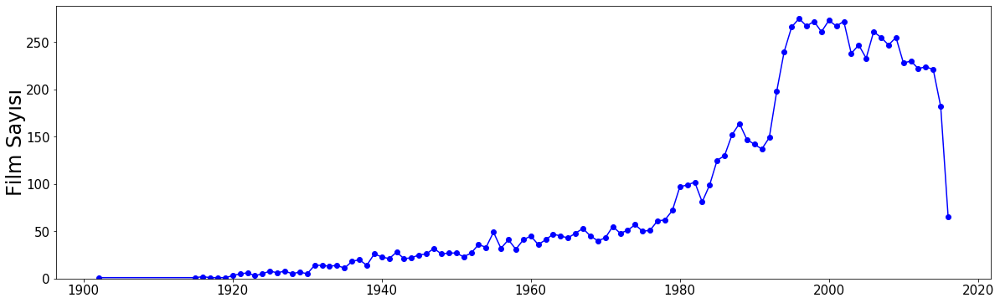

Elapsed time(sec):  0.15


In [174]:
st = default_timer()



# Let's work with a temp smaller slice 'dftmp' of the original dataframe to reduce runtime (ratings hass +2MM rows)
dftmp = movies[['movieId', 'year']].groupby('year')

fig, ax1 = plt.subplots(figsize=(20,6))
ax1.plot(dftmp.year.first(), dftmp.movieId.nunique(), "b-o")
#ax1.grid(None)
ax1.set_ylim(0,)

dftmp = ratings[['rating', 'timestamp']].groupby('timestamp')
#ax2 = ax1.twinx()
#ax2.plot(dftmp.timestamp.first(), dftmp.rating.count(), "r-o")
#ax2.grid(None)
#ax2.set_ylim(0,)

ax1.set_xlabel('')
ax1.set_ylabel('Film Sayısı',fontsize = 24, labelpad = 0); #ax2.set_ylabel('Number of ratings')
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('')
plt.show(211)

# Housekeeping
%reset_selective -f (^dftmp$|^ax1$|^ax2$)

runtime = default_timer() - st
print ("Elapsed time(sec): ", round(runtime,2))
fig.savefig('temp.png', transparent=True)

In [188]:
print(movies[genre])

KeyError: 'Macera'

<Figure size 720x360 with 0 Axes>

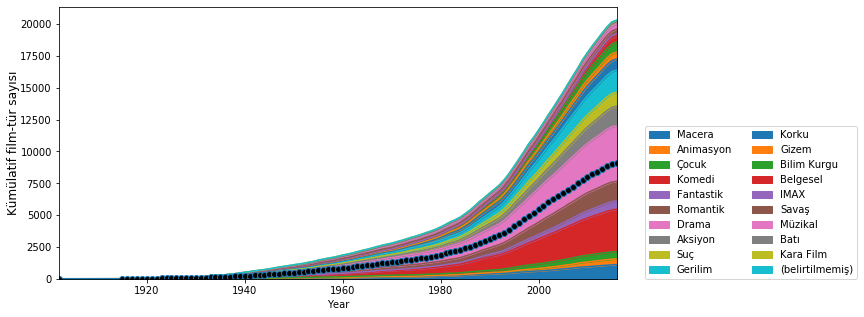

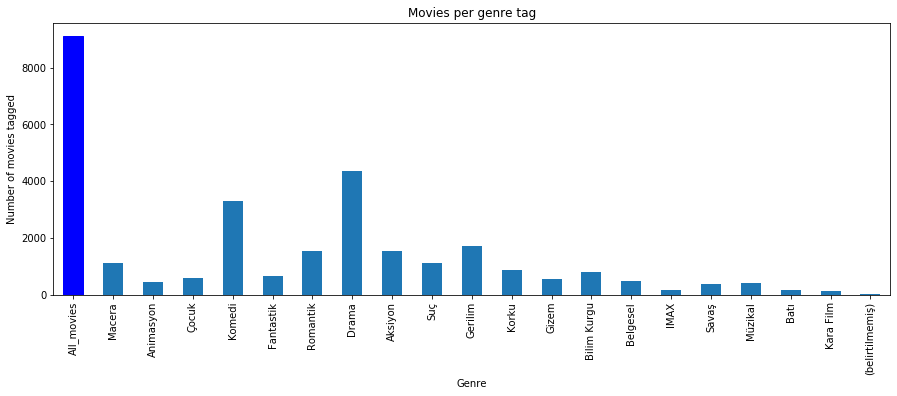

Elapsed time(sec):  0.5


In [200]:
st = default_timer()

plt.figure(figsize=(10,5))
dftmp = movies[['movieId', 'year']].groupby('year')

df = pd.DataFrame({'All_movies' : dftmp.movieId.nunique().cumsum()})
# Plot histogram for each individual genre

for genre in genres_unique.genre:
    if genre=="Macera":
        genre="Adventure"
    if genre=="Animasyon":
        genre="Animation"
    if genre=="Çocuk":
        genre="Children"
    if genre=="Komedi":
        genre="Comedy"
    if genre=="Fantastik":
        genre="Fantasy"
    if genre=="Romantik":
        genre="Romance"
    if genre=="Drama":
        genre="Drama"
    if genre=="Aksiyon":
        genre="Action"
    if genre=="Suç":
        genre="Crime"
    if genre=="Gerilim":
        genre="Thriller"
    if genre=="Korku":
        genre="Horror"
    if genre=="Gizem":
        genre="Mystery"
    if genre=="Bilim Kurgu":
        genre="Sci-Fi"
    if genre=="Belgesel":
        genre="Documentary"
    if genre=="IMAX":
        genre="IMAX"
    if genre=="Savaş":
        genre="War"
    if genre=="Müzikal":
        genre="Musical"
    if genre=="Batı":
        genre="Western"
    if genre=="Kara Film":
        genre="Film-Noir"
    if genre=="(belirtilmemiş)":
        genre="(no genres listed)"
    dftmp = movies[movies[genre]][['movieId', 'year']].groupby('year')
    if genre=="Adventure":
        genre="Macera"
    if genre=="Animation":
        genre="Animasyon"
    if genre=="Children":
        genre="Çocuk"
    if genre=="Comedy":
        genre="Komedi"
    if genre=="Fantasy":
        genre="Fantastik"
    if genre=="Romance":
        genre="Romantik"
    if genre=="Drama":
        genre="Drama"
    if genre=="Action":
        genre="Aksiyon"
    if genre=="Crime":
        genre="Suç"
    if genre=="Thriller":
        genre="Gerilim"
    if genre=="Horror":
        genre="Korku"
    if genre=="Mystery":
        genre="Gizem"
    if genre=="Sci-Fi":
        genre="Bilim Kurgu"
    if genre=="Documentary":
        genre="Belgesel"
    if genre=="IMAX":
        genre="IMAX"
    if genre=="War":
        genre="Savaş"
    if genre=="Musical":
        genre="Müzikal"
    if genre=="Western":
        genre="Batı"
    if genre=="Film-Noir":
        genre="Kara Film"
    if genre=="(no genres listed)":
        genre="(belirtilmemiş)"
    df[genre]=dftmp.movieId.nunique().cumsum()
    #print(movies[genre])
df.fillna(method='ffill', inplace=True)
df.loc[:,df.columns!='All_movies'].plot.area(stacked=True, figsize=(10,5))
# Plot histogram for all movies

plt.plot(df['All_movies'], marker='o', markerfacecolor='black')
plt.xlabel('Year')
plt.ylabel('Kümülatif film-tür sayısı',fontsize = 12, labelpad = 0)
#plt.title('Total movies-genre') # Many movies have multiple genres, so counthere is higher than number of movies
plt.legend(loc=(1.05,0), ncol=2)
plt.show()
# Plot simple scatter of the number of movies tagged with each genre
plt.figure(figsize=(15,5))
barlist = df.iloc[-1].plot.bar()
barlist.patches[0].set_color('b') # Color 'All_movies' differently, as it's not a genre tag count
plt.xticks(rotation='vertical')
plt.title('Movies per genre tag')
plt.xlabel('Genre')
plt.ylabel('Number of movies tagged')
plt.show()

# Housekeeping
%reset_selective -f (^barlist$|^dftmp$|^genre$)

runtime = default_timer() - st
print ("Elapsed time(sec): ", round(runtime,2))